*BY: ISMAIL ABU SAIID*


# **Brain Tumour Image Segmentation**


---

**ABSTRACT**

In this study, a U-net model and a morphological image processing technique were used to improve the segmentation of brain MR images. The U-net model was chosen because it can accurately segment images by capturing both local and global picture properties. The study aimed to improve the segmentation results by modifying the borders of the segmented regions by incorporating a morphological image processing method into the pipeline. The administration of big and numerous image databases was the project's main obstacle. A downsampling technique was used to solve this problem, enabling effective data processing while maintaining crucial data required for precise segmentation. The study's findings showed a notable improvement in the precision of tumour areas' detection in brain MR images.


---



**DATASET**

The LGG (Brain Tumor) Segmentation Dataset is a collection of brain magnetic resonance (MR) images and corresponding manual segmentation masks for FLAIR abnormality. The dataset was obtained from the Cancer Imaging Archive (TCIA) and consists of images from 110 patients included in The Cancer Genome Atlas (TCGA) lower-grade glioma collection. Which we found through Kaggle. The dataset is provided in the form of TIFF images. Each image is accompanied by a corresponding segmentation mask that highlights the abnormal regions in the FLAIR images. In total, the dataset comprises 7,858 images, with 3,929 images representing the original MRI scans and the remaining 3,929 images serving as the corresponding masks for the original images. The dataset is organized into 110 folders, where each folder is named after the case ID and contains information about the source institution. This organization facilitates easy access to images and their corresponding metadata, allowing researchers and practitioners to analyze the data efficiently.



---



**CONTENT**

**1. Importing Libraries**

**2. Loading Dataset**

**3. EDA & Visualization**

**4. Dataset Partitioning**

**5. Data Pre-processing**
- Data Augmentation
- Normalization and Mask Thresholding
- Data Generators

**6. Evaluation Metrics**

**7. Model Development**
- Model Architecture (U-Net)
- Model Compilation
- Model Training

**8. Model Evaluation**

**9. Morphological Image Processing**
- Thresholding and Morphological Operations
- Applying Morphological Operations to Predicted Masks

**10. Prediction Results (U-Net Only vs Hybrid)**



---



**1. Importing Libraries**

In [ ]:
from glob import glob
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import tensorflow.keras.backend as K
import random
from sklearn.preprocessing import StandardScaler, normalize
from IPython.display import display
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, Adamax

**2. Loading Dataset**

In [ ]:
data_dir = 'drive/MyDrive/Brain MRI/'

def create_df(data_dir):
    image_path = []
    mask_path = glob(f'{data_dir}/*/*_mask*')

    for i in mask_path:
        image_path.append(i.replace('_mask', ''))

    df = pd.DataFrame(data= {'image_path': image_path, 'mask_path': mask_path})

    return df

def mask_valid(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 :
        return 1
    else:
        return 0


In [ ]:
# Load Images into Dataframe
df = create_df(data_dir)
df['mask'] = df['mask_path'].apply(lambda x: mask_valid(x))
print(df.head())

                                          image_path  \
0  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...   
1  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...   
2  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...   
3  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...   
4  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...   

                                           mask_path  mask  
0  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...     1  
1  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...     0  
2  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...     1  
3  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...     0  
4  drive/MyDrive/Brain MRI/TCGA_HT_8106_19970727/...     1  


In [ ]:
print(df.tail())

                                             image_path  \
3924  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...   
3925  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...   
3926  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...   
3927  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...   
3928  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...   

                                              mask_path  mask  
3924  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...     0  
3925  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...     0  
3926  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...     0  
3927  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...     0  
3928  drive/MyDrive/Brain MRI/TCGA_CS_6188_20010812/...     0  


**3. EDA & Visualization**

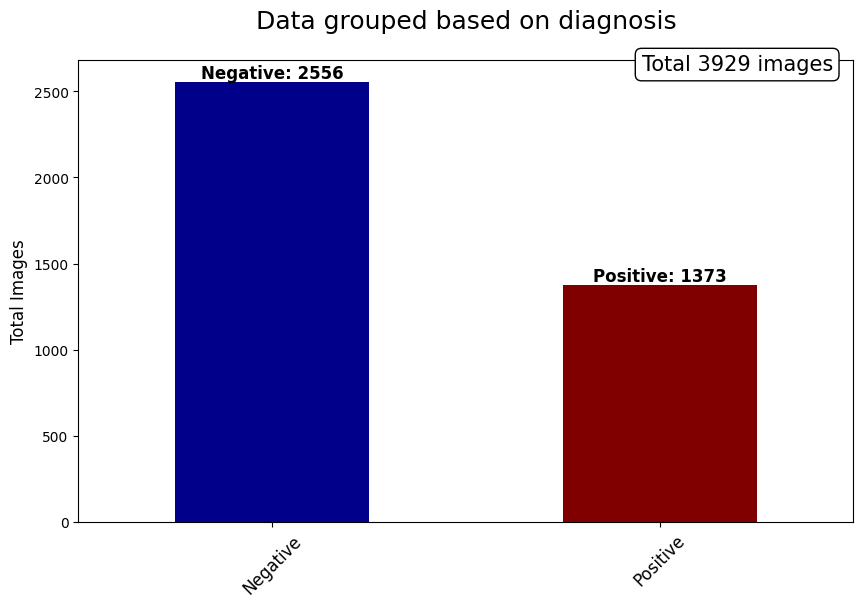

In [ ]:
# Mask Labels
mask_labels = df['mask'].value_counts()

ax = mask_labels.plot(kind='bar', stacked=True, figsize=(10, 6), color=["darkblue", "maroon"])
ax.set_xticklabels(["Negative", "Positive"], rotation=45, fontsize=12)
ax.set_ylabel('Total Images', fontsize=12)
ax.set_title("Data grouped based on diagnosis", fontsize=18, y=1.05)

# Annotate with counts
for i, count in enumerate(mask_labels.values):
    ax.annotate(int(count), xy=(i, count-12), rotation=0, color="white", ha="center",
                verticalalignment='bottom', fontsize=15, fontweight="bold")

# Annotate with positive and negative counts
positive_count = mask_labels[1]
negative_count = mask_labels[0]
ax.annotate(f"Positive: {positive_count}", xy=(1, positive_count + 50), rotation=0,
            color="black", ha="center", va="center", fontsize=12, fontweight="bold")
ax.annotate(f"Negative: {negative_count}", xy=(0, negative_count + 50), rotation=0,
            color="black", ha="center", va="center", fontsize=12, fontweight="bold")

# Annotate with total count
total_count = len(df)
ax.text(1.2, mask_labels.max() + 100, f"Total {total_count} images", size=15,
        color="black", ha="center", va="center",
        bbox=dict(boxstyle="round", fc="white", ec="black"))

plt.show()

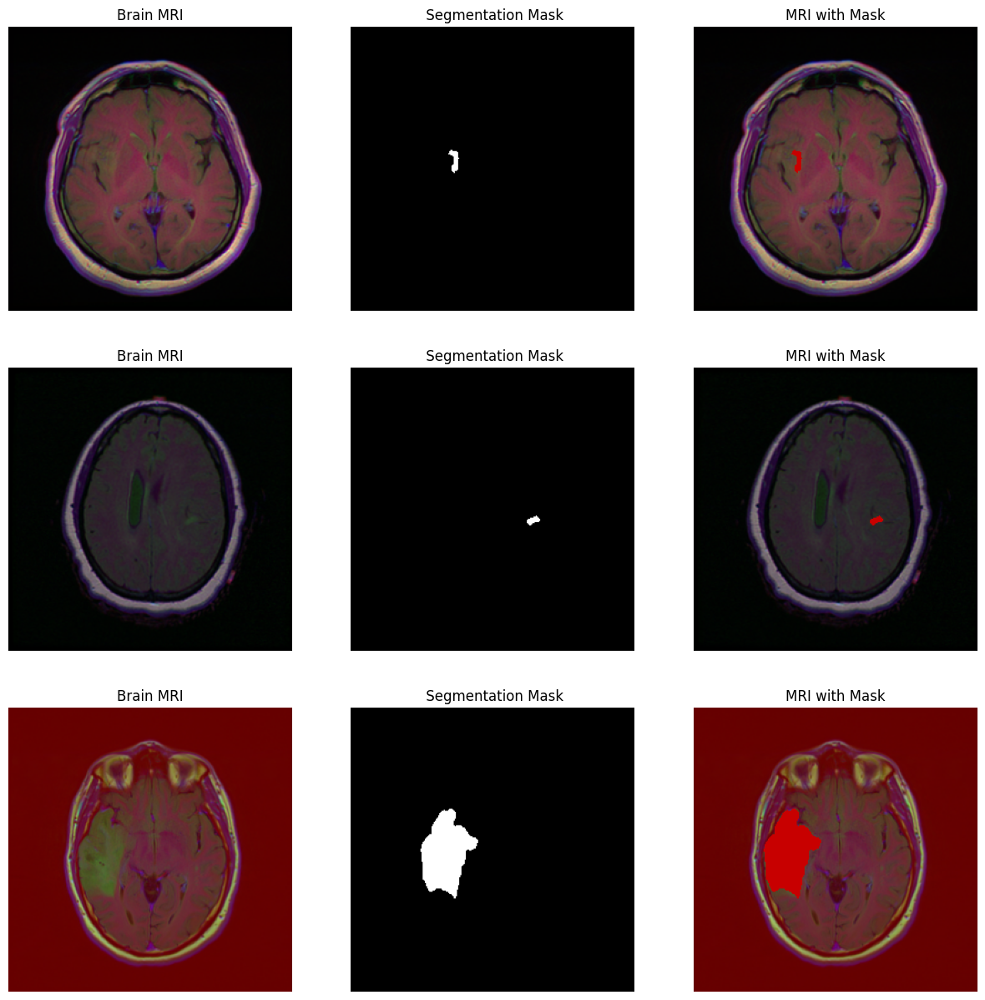

In [ ]:
# Displaying 3 MRI images with its corrosponding mask
count = 0
fig,axs = plt.subplots(3,3, figsize=(15,15))
while count < 3:
    i = random.randint(0, len(df))
    if cv2.imread(df.mask_path[i]).max() > 0:
        img = io.imread(df.image_path[i])
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)
        axs[count][0].axis("off")

        mask = io.imread(df.mask_path[i])
        axs[count][1].title.set_text(" Segmentation Mask")
        axs[count][1].imshow(mask, cmap='gray')
        axs[count][1].axis("off")

        img[mask==255] = (200,0,0)  # change pixel color at the position of mask
        axs[count][2].title.set_text("MRI with Mask")
        axs[count][2].imshow(img)
        axs[count][2].axis("off")

        count +=1

**4. Dataset Partitioning**

In [ ]:
# Partion the dataset

np.random.seed(42)
df = df.sample(frac=1)
train_df, test_df = train_test_split(df, train_size=0.75, stratify=df['mask'], random_state=42)
valid_df, test_df = train_test_split(test_df, train_size=0.5, stratify=test_df['mask'], random_state=42)

train_df = train_df.drop('mask', axis=1)
valid_df = valid_df.drop('mask', axis=1)
test_df = test_df.drop('mask', axis=1)

**5. Data Pre-processing**
- Data Augmentation
- Normalization and Mask Thresholding


In [ ]:
# Data Augmentation
def create_gen(df, aug_dict):
    img_size = (256, 256)
    batch_size = 25

    img_gen = ImageDataGenerator(**aug_dict)
    msk_gen = ImageDataGenerator(**aug_dict)

    image_gen = img_gen.flow_from_dataframe(df, x_col='image_path', class_mode=None, color_mode='rgb', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix='image', seed=1)

    mask_gen = msk_gen.flow_from_dataframe(df, x_col='mask_path', class_mode=None, color_mode='grayscale', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix= 'mask', seed=1)

    gen = zip(image_gen, mask_gen)

    for (img, msk) in gen:
        img = img / 255
        msk = msk / 255
        msk[msk > 0.5] = 1
        msk[msk <= 0.5] = 0

        yield (img, msk)

- Data Generators

In [ ]:
# Augment the training data
train_aug = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

# Data Generators that generate the training, validation and testing sets
train_gen = create_gen(train_df, aug_dict=train_aug)
valid_gen = create_gen(valid_df, aug_dict={})
test_gen = create_gen(test_df, aug_dict={})

**6. Evaluation Metrics**

In [ ]:
# Evaluation Metrics
def dice_coef(y_true, y_pred, smooth=1.0):
    intersection = K.sum(y_true * y_pred)
    return (2.0 * intersection + smooth) / (K.sum(y_true) + K.sum(y_pred) + smooth)

def dice_loss(y_true, y_pred, smooth=1.0):
    return -dice_coef(y_true, y_pred, smooth)

def iou_coef(y_true, y_pred, smooth=1.0):
    intersection = K.sum(K.cast(y_true, 'float32') * K.cast(y_pred, 'float32'))
    union = K.sum(K.cast(K.greater(K.clip(y_true + y_pred, 0, 1), 0.5), 'float32'))
    return (intersection + smooth) / (union + smooth)

# Function to plot the Metrics
def plot_training(hist):
    tr_acc = hist.history['accuracy']
    tr_iou = hist.history['iou_coef']
    tr_dice = hist.history['dice_coef']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_iou = hist.history['val_iou_coef']
    val_dice = hist.history['val_dice_coef']
    val_loss = hist.history['val_loss']

    Epochs = [i+1 for i in range(len(tr_acc))]


    plt.figure(figsize= (20, 20))

    # Loss
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_loss, label= 'Training loss')
    plt.plot(Epochs, val_loss, label= 'Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    # Save the graph as loss.png in the current directory
    plt.savefig('./loss.png')

    # Accuracy
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_acc, label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, label= 'Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    # Save the graph as accuracy.png in the current directory
    plt.savefig('./accuracy.png')

    # IoU
    plt.subplot(2, 2, 3)
    plt.plot(Epochs, tr_iou, label= 'Training IoU')
    plt.plot(Epochs, val_iou, label= 'Validation IoU')
    plt.title('Training and Validation IoU Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()
    # Save the graph as iou.png in the current directory
    plt.savefig('./iou.png')

    # Dice
    plt.subplot(2, 2, 4)
    plt.plot(Epochs, tr_dice, label= 'Training Dice')
    plt.plot(Epochs, val_dice, label= 'Validation Dice')
    plt.title('Training and Validation Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice')
    plt.legend()
    # Save the graph as dice.png in the current directory
    plt.savefig('./dice.png')

    plt.tight_layout
    plt.show()

**7. Model Development**
- Model Architecture (U-Net)

In [ ]:
# U-net Model

def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder
    conv1 = Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottom
    conv3 = Conv2D(128, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, 3, activation='relu', padding='same')(conv3)

    # Decoder
    up4 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv3)
    up4 = concatenate([up4, conv2], axis=3)
    conv4 = Conv2D(64, 3, activation='relu', padding='same')(up4)
    conv4 = Conv2D(64, 3, activation='relu', padding='same')(conv4)

    up5 = Conv2DTranspose(32, 2, strides=(2, 2), padding='same')(conv4)
    up5 = concatenate([up5, conv1], axis=3)
    conv5 = Conv2D(32, 3, activation='relu', padding='same')(up5)
    conv5 = Conv2D(32, 3, activation='relu', padding='same')(conv5)

    # Output
    outputs = Conv2D(1, 1, activation='sigmoid')(conv5)

    return Model(inputs=[inputs], outputs=outputs)

- Model Compilation

In [ ]:
model = unet()
model.compile(Adamax(learning_rate= 0.001), loss= dice_loss, metrics= ['accuracy', iou_coef, dice_coef])

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

- Model Training

In [ ]:
# Model Training

with tf.device('/device:GPU:0'):
    epochs = 100
    batch_size = 25
    callbacks = [ModelCheckpoint('unet.hdf5', verbose=0, save_best_only=True)]

    history = model.fit(train_gen,
                        steps_per_epoch=len(train_df) / batch_size,
                        epochs=epochs,
                        verbose=1,
                        callbacks=callbacks,
                        validation_data = valid_gen,
                        validation_steps=len(valid_df) / batch_size)

Found 2946 validated image filenames.
Found 2946 validated image filenames.
Epoch 1/100
118/117 [==============================] - ETA: 0s - loss: -0.2950 - accuracy: 0.9271 - iou_coef: 0.2151 - dice_coef: 0.2953Found 491 validated image filenames.
Found 491 validated image filenames.
117/117 [==============================] - 871s 7s/step - loss: -0.2950 - accuracy: 0.9271 - iou_coef: 0.2151 - dice_coef: 0.2953 - val_loss: -0.2931 - val_accuracy: 0.9601 - val_iou_coef: 0.1733 - val_dice_coef: 0.2912
Epoch 2/100
117/117 [==============================] - 84s 712ms/step - loss: -0.4758 - accuracy: 0.9876 - iou_coef: 0.3273 - dice_coef: 0.4757 - val_loss: -0.4079 - val_accuracy: 0.9919 - val_iou_coef: 0.2643 - val_dice_coef: 0.4105
Epoch 3/100
117/117 [==============================] - 79s 677ms/step - loss: -0.5055 - accuracy: 0.9900 - iou_coef: 0.3512 - dice_coef: 0.5051 - val_loss: -0.5805 - val_accuracy: 0.9928 - val_iou_coef: 0.4204 - val_dice_coef: 0.5812
Epoch 4/100
117/117 [=====

In [ ]:
# The best model checkpoint saved to the specified file 'unet.hdf5'
# This is to save the entire model
model.save('unet_model.h5')

**8. Model Evaluation**

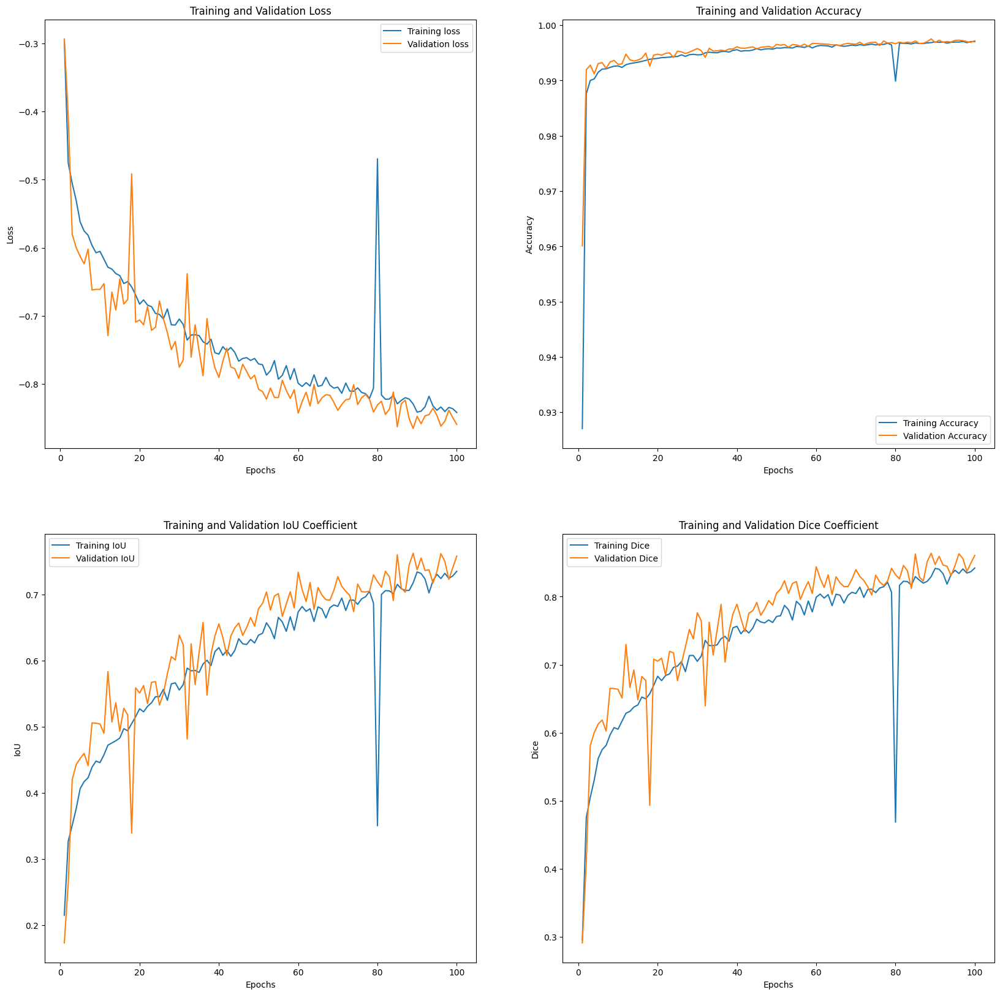

In [ ]:
# Visualize Training Process
plot_training(history)

In [ ]:
# Register the custom evaluation functions
from tensorflow import keras
keras.utils.get_custom_objects().update({"dice_loss": dice_loss})
keras.utils.get_custom_objects().update({"iou_coef": iou_coef})
keras.utils.get_custom_objects().update({"dice_coef": dice_coef})

# Load the saved model
loaded_model = keras.models.load_model('unet.hdf5')

In [ ]:
# Metric Evaluation

test_batch_size = max(sorted([len(test_df) // n for n in range(1, len(test_df) + 1) if len(test_df)%n == 0 and len(test_df)/n <= 80]))
test_steps = len(test_df) // test_batch_size

train_score = loaded_model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = loaded_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = loaded_model.evaluate(test_gen, steps= test_steps, verbose= 1)


print("Train IoU: ", round(train_score[2],3))
print("Train Dice: ", round(train_score[3],3))
print('-' * 35)

print("Valid IoU: ", round(valid_score[2],3))
print("Valid Dice: ", round(valid_score[3],3))
print('-' * 35)

print("Test IoU: ", round(test_score[2],3))
print("Test Dice: ", round(test_score[3],3))

Found 2946 validated image filenames.
Found 2946 validated image filenames.
12/12 [==============================] - 92s 7s/step - loss: -0.8116 - accuracy: 0.9974 - iou_coef: 0.6890 - dice_coef: 0.8116
Found 491 validated image filenames.
Found 491 validated image filenames.
12/12 [==============================] - 85s 8s/step - loss: -0.8277 - accuracy: 0.9971 - iou_coef: 0.7100 - dice_coef: 0.8277
Found 492 validated image filenames.
Found 492 validated image filenames.
12/12 [==============================] - 88s 8s/step - loss: -0.7779 - accuracy: 0.9970 - iou_coef: 0.6543 - dice_coef: 0.7779
Train IoU:  0.689
Train Dice:  0.812
-----------------------------------
Valid IoU:  0.71
Valid Dice:  0.828
-----------------------------------
Test IoU:  0.654
Test Dice:  0.778


1/1 [==============================] - 0s 19ms/step


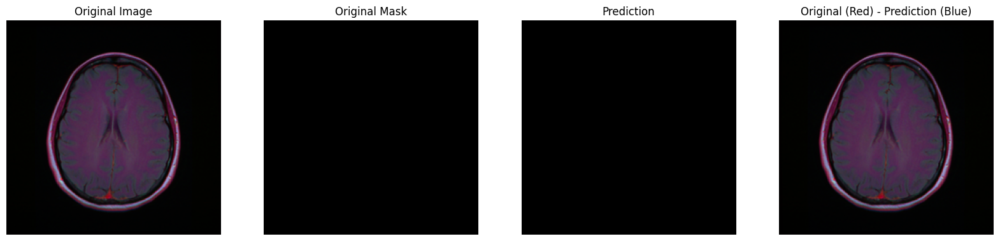

1/1 [==============================] - 0s 19ms/step


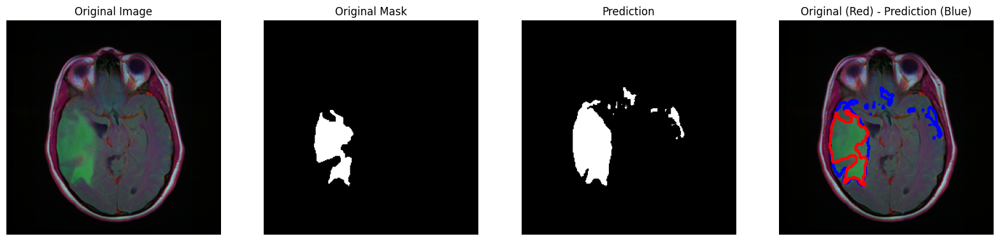

1/1 [==============================] - 0s 23ms/step


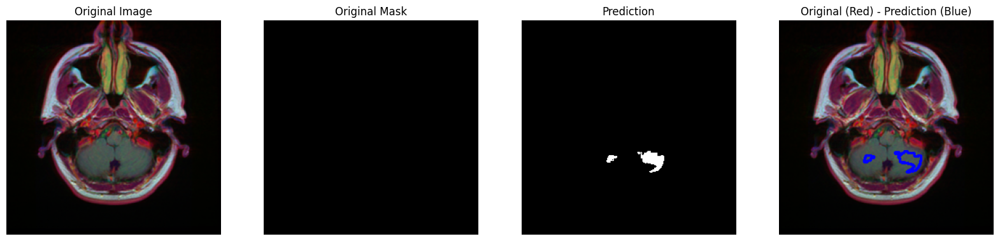

1/1 [==============================] - 0s 26ms/step


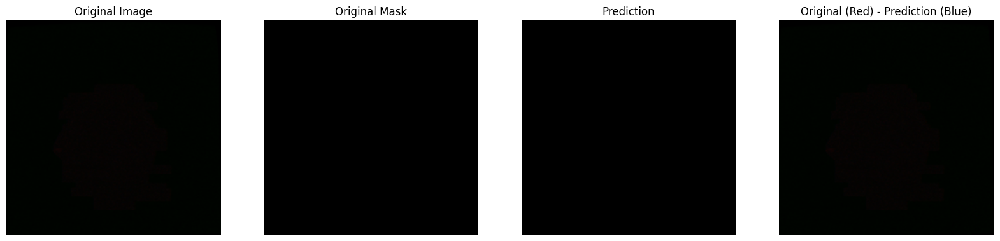

1/1 [==============================] - 0s 22ms/step


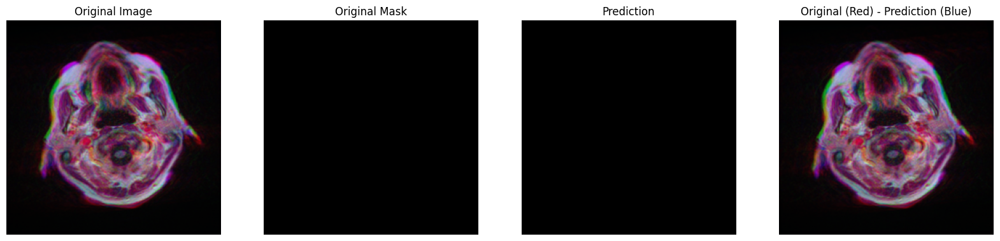

1/1 [==============================] - 0s 26ms/step


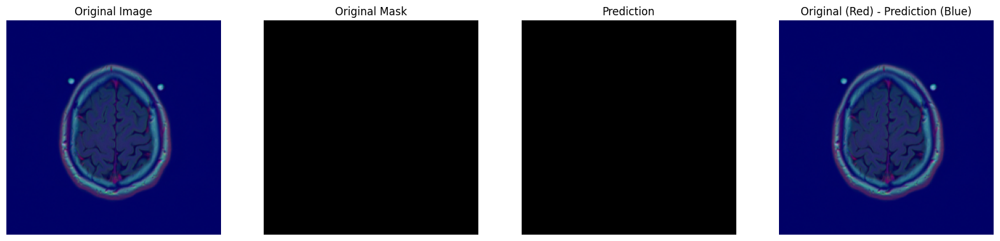

1/1 [==============================] - 0s 20ms/step


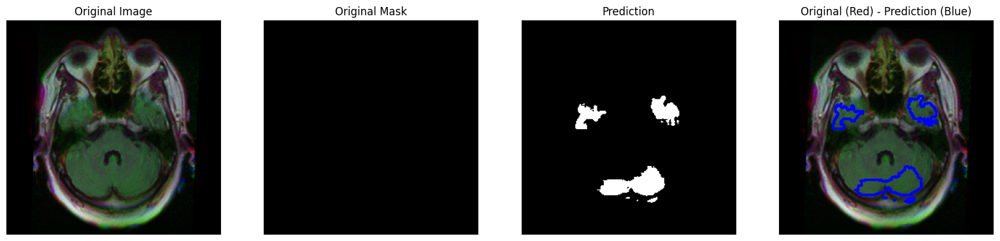

1/1 [==============================] - 0s 20ms/step


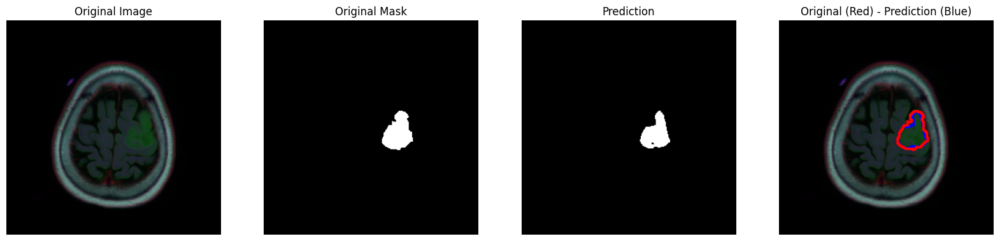

1/1 [==============================] - 0s 22ms/step


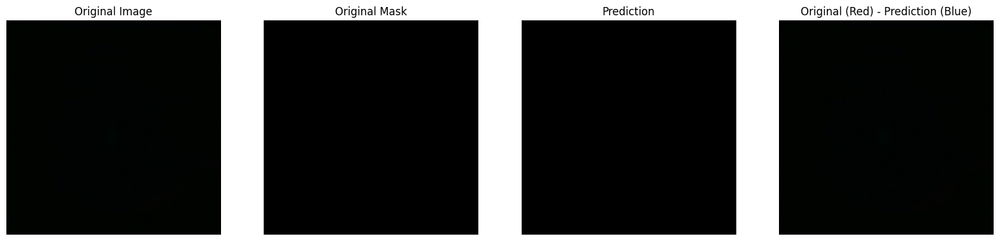

1/1 [==============================] - 0s 21ms/step


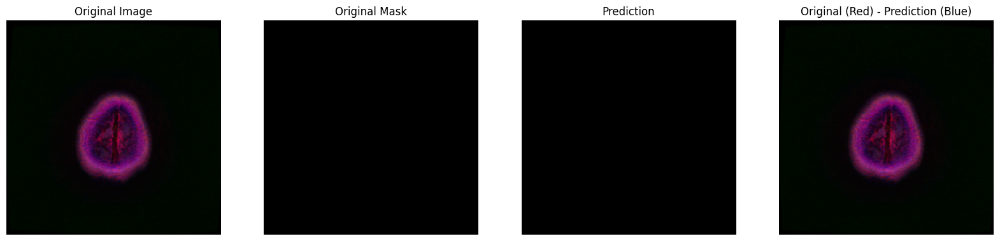

1/1 [==============================] - 0s 21ms/step


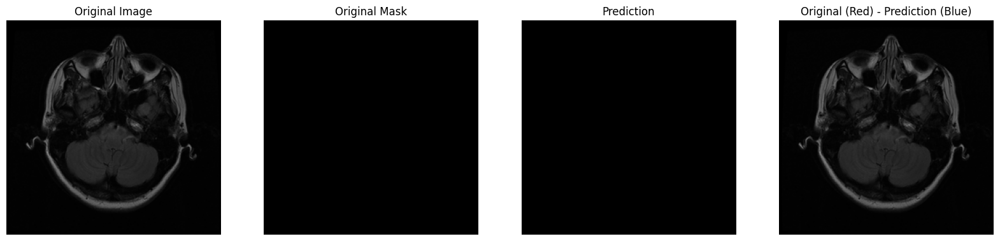

1/1 [==============================] - 0s 24ms/step


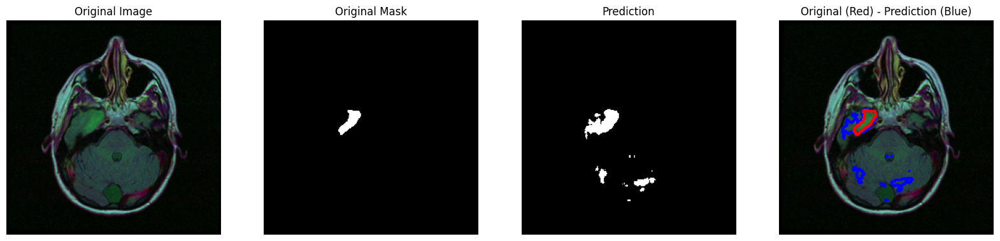

1/1 [==============================] - 0s 27ms/step


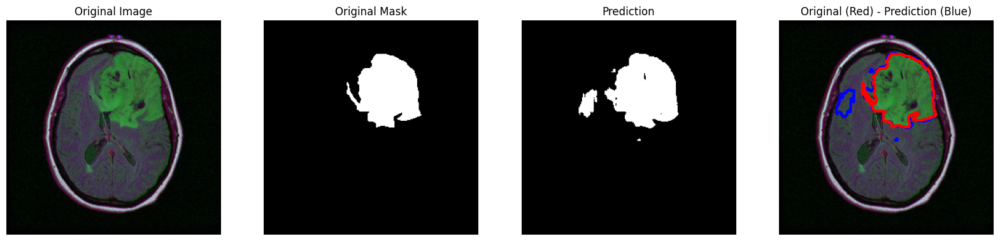

1/1 [==============================] - 0s 58ms/step


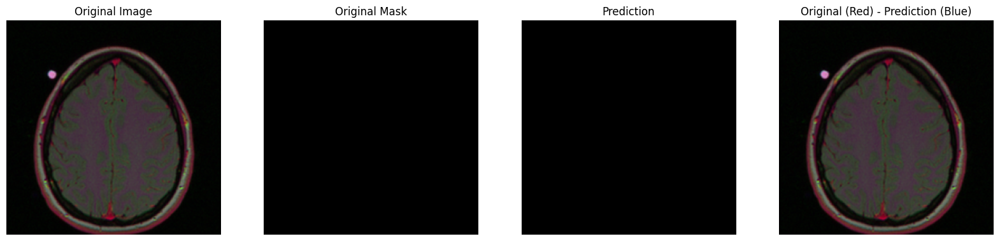

1/1 [==============================] - 0s 31ms/step


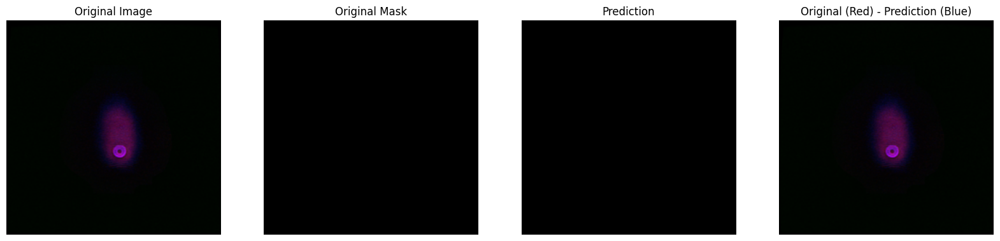

1/1 [==============================] - 0s 29ms/step


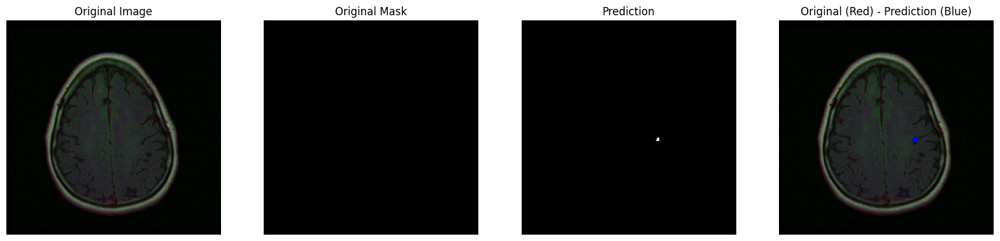

1/1 [==============================] - 0s 36ms/step


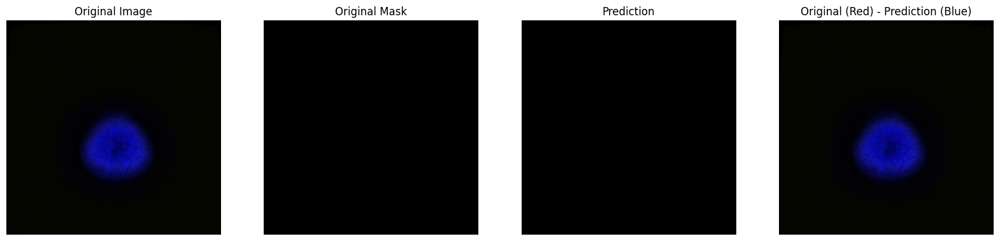

1/1 [==============================] - 0s 27ms/step


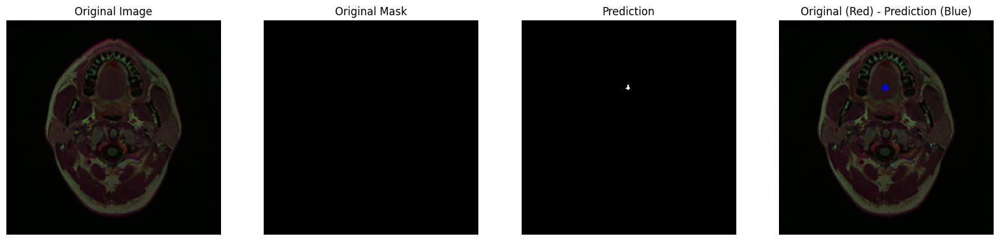

1/1 [==============================] - 0s 25ms/step


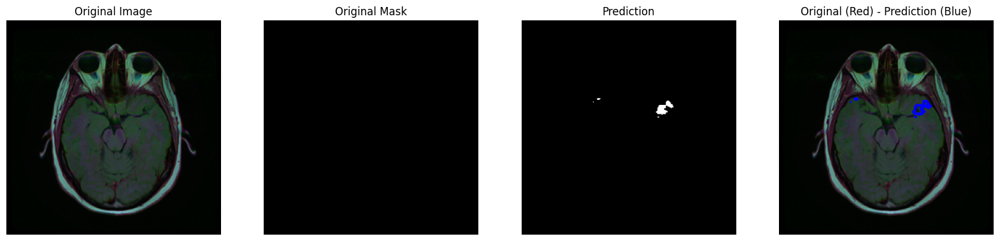

1/1 [==============================] - 0s 29ms/step


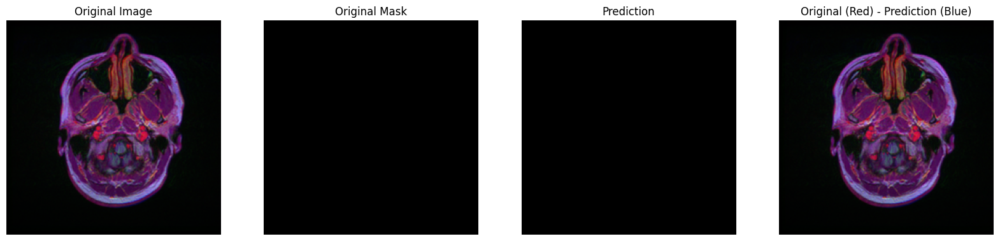

1/1 [==============================] - 0s 30ms/step


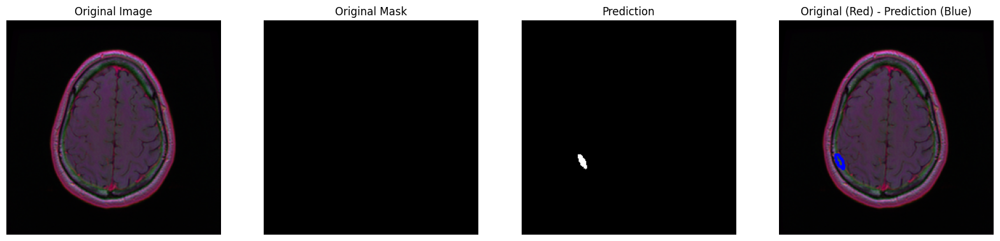

1/1 [==============================] - 0s 29ms/step


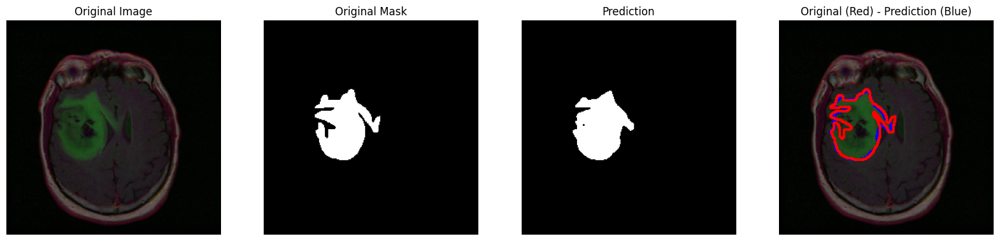

1/1 [==============================] - 0s 26ms/step


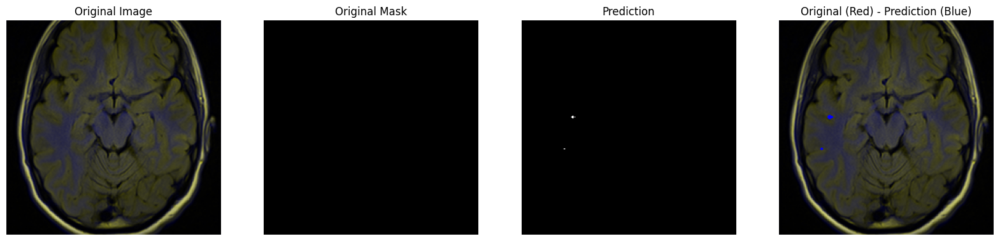

1/1 [==============================] - 0s 26ms/step


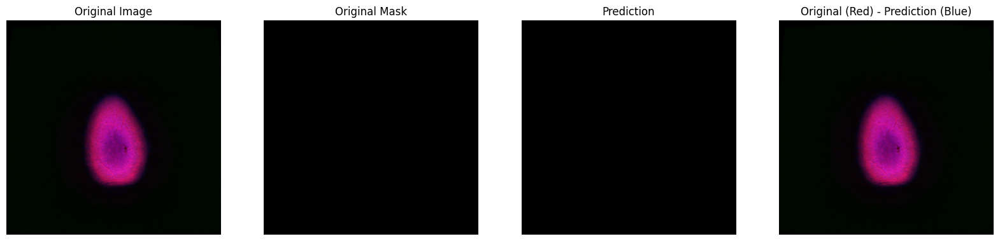

1/1 [==============================] - 0s 30ms/step


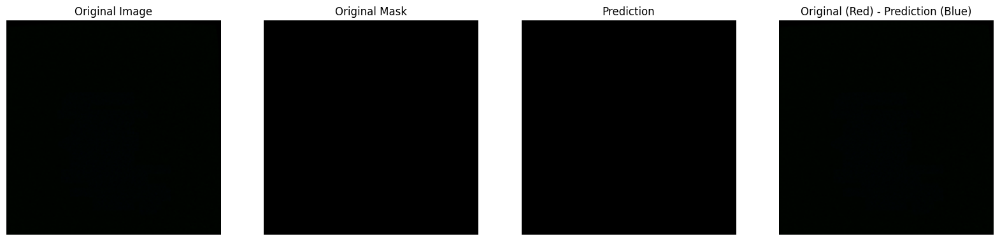

1/1 [==============================] - 0s 28ms/step


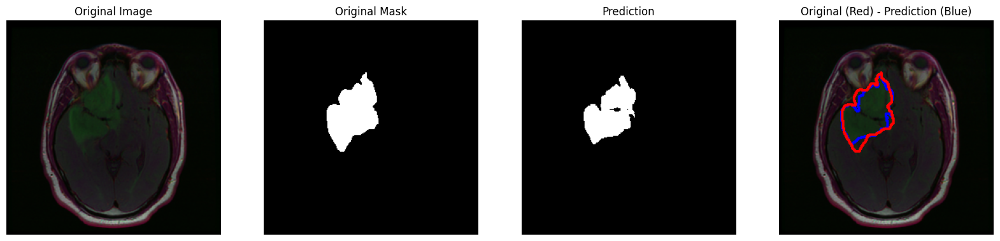

1/1 [==============================] - 0s 29ms/step


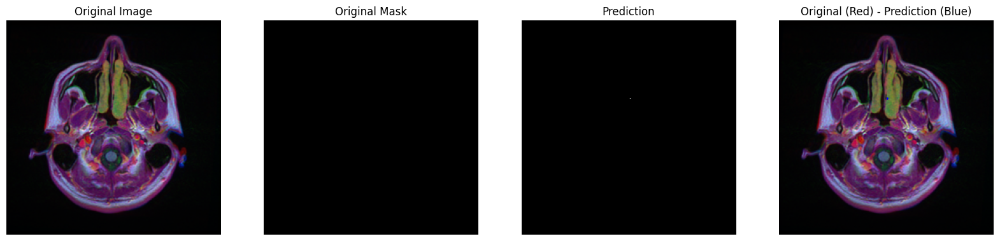

1/1 [==============================] - 0s 33ms/step


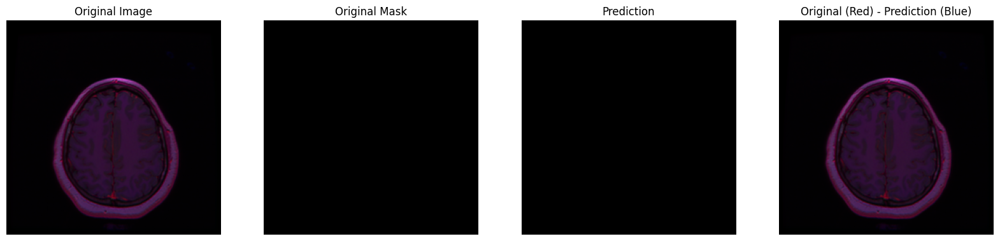

1/1 [==============================] - 0s 27ms/step


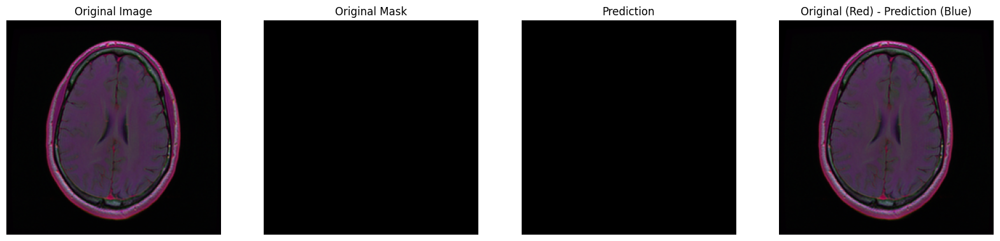

1/1 [==============================] - 0s 29ms/step


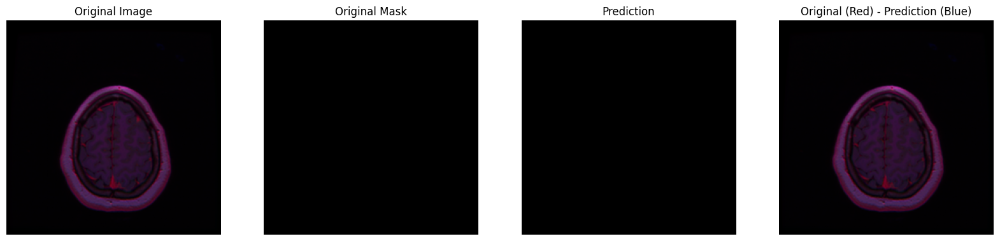

In [ ]:
# Model Evaluation (With U-Net Only)

for index in range(30):
    img = cv2.imread(test_df['image_path'].iloc[index])
    img = cv2.resize(img, (256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, :]

    mask = cv2.imread(test_df['mask_path'].iloc[index], cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (256, 256))

    predicted_img = loaded_model.predict(img)[0]
    predicted_img_bin = cv2.threshold(predicted_img, 0.5, 1, cv2.THRESH_BINARY)[1]

    plt.figure(figsize=(20, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(np.squeeze(img))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 4, 2)
    plt.imshow(np.squeeze(mask), cmap='gray')
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 4, 3)
    plt.imshow(predicted_img_bin, cmap='gray')
    plt.axis('off')
    plt.title('Prediction')

    plt.subplot(1, 4, 4)
    img_contour = np.squeeze(img)
    mask_contour = np.uint8(np.squeeze(mask))
    predicted_contour = np.uint8(np.squeeze(predicted_img_bin))
    contours, _ = cv2.findContours(predicted_contour, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contour = cv2.drawContours(img_contour, contours, -1, (0, 0, 255), 2)
    contours, _ = cv2.findContours(mask_contour, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contour = cv2.drawContours(img_contour, contours, -1, (255, 0, 0), 2)
    plt.imshow(img_contour, cmap='gray')
    plt.axis('off')
    plt.title('Original (Red) - Prediction (Blue)')

    plt.show()

**9. Morphological Image Processing**
- Thresholding and Morphological Operations

In [ ]:
# Threshold value to convert predicted mask into binary mask
threshold = 0.5

# Define the kernel for morphological operations
kernel_size = 3
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))

# Function to apply morphological operations on the predicted mask
def apply_morphological_operations(mask):
    # Convert predicted mask to binary mask using thresholding
    binary_mask = (mask > threshold).astype(np.uint8)

    # Perform dilation and erosion on the binary mask
    dilated_mask = cv2.dilate(binary_mask, kernel, iterations=1)
    refined_mask = cv2.erode(dilated_mask, kernel, iterations=1)

    return refined_mask

- Applying Morphological Operations to Predicted Masks

In [ ]:
# Get a batch of input data from the generator
batch_images, _ = next(train_gen)

# Get the predicted mask from the U-Net model
predicted_mask = loaded_model.predict(batch_images)

# Apply morphological operations to refine the mask
refined_mask = apply_morphological_operations(predicted_mask[0])

1/1 [==============================] - 0s 53ms/step


**10. Prediction Results (U-Net Only vs Hybrid)**

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


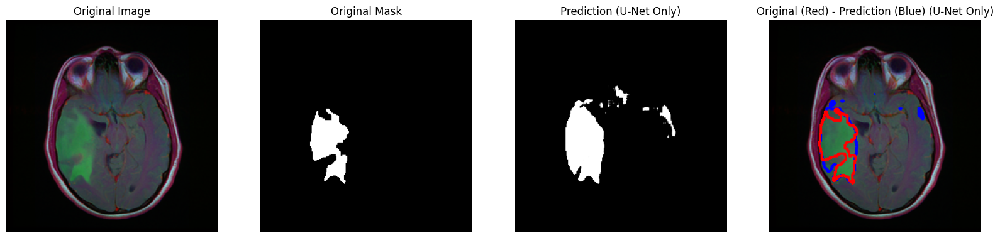

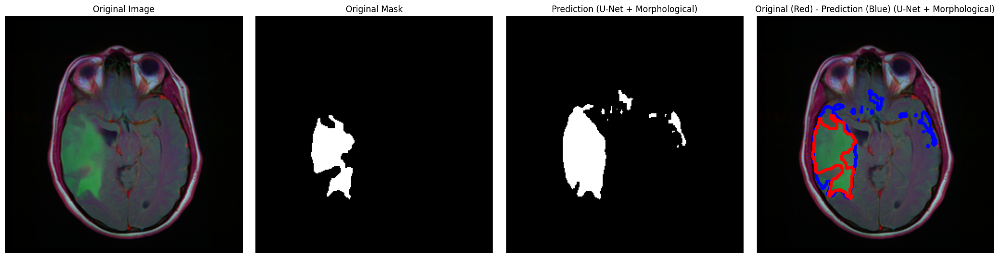

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 18ms/step


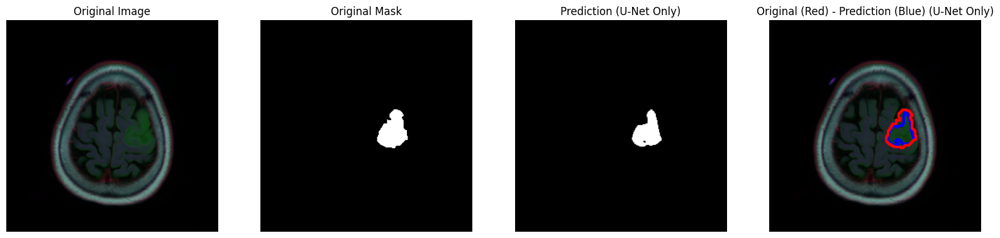

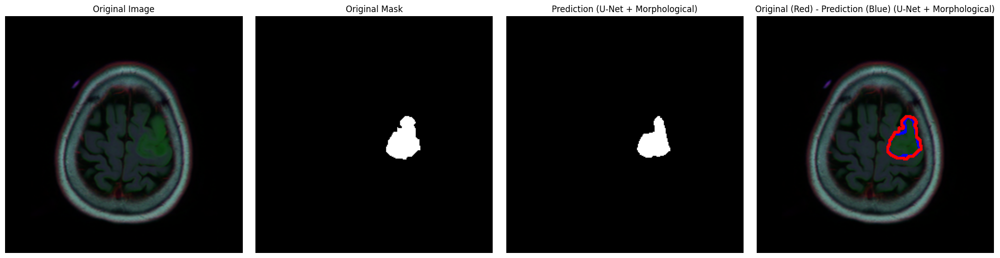

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


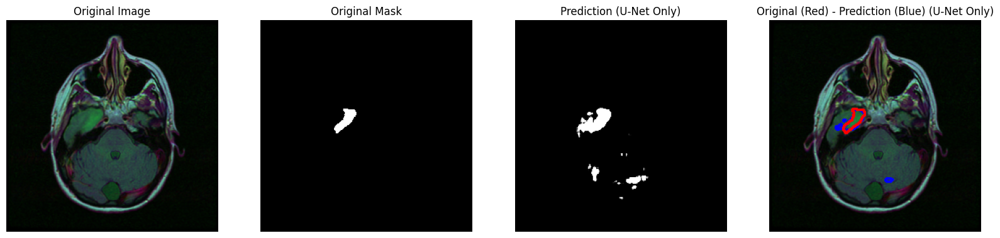

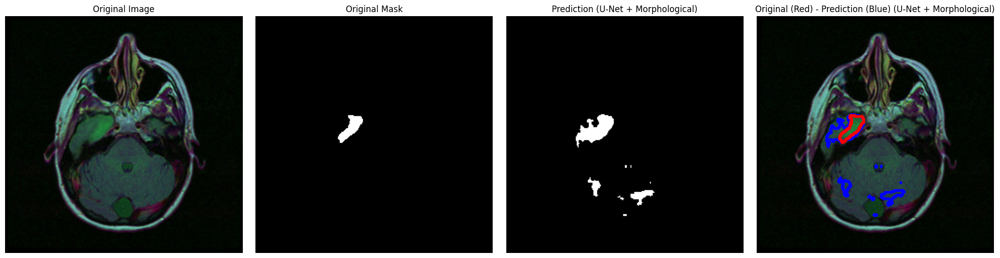

1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 28ms/step


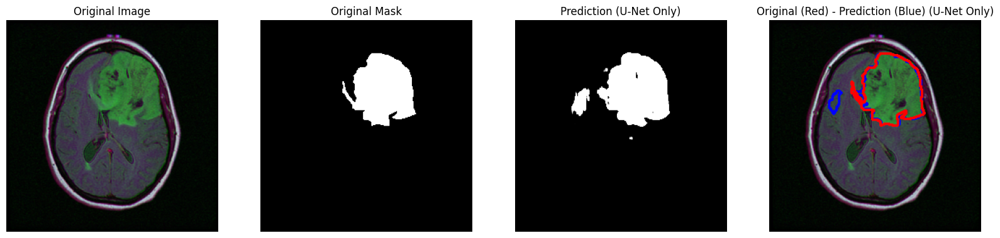

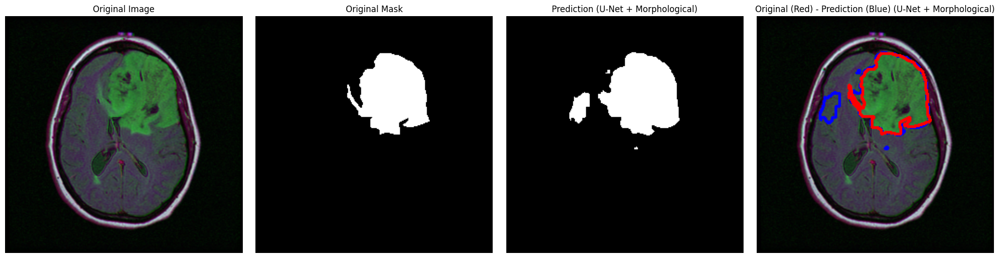

1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 33ms/step


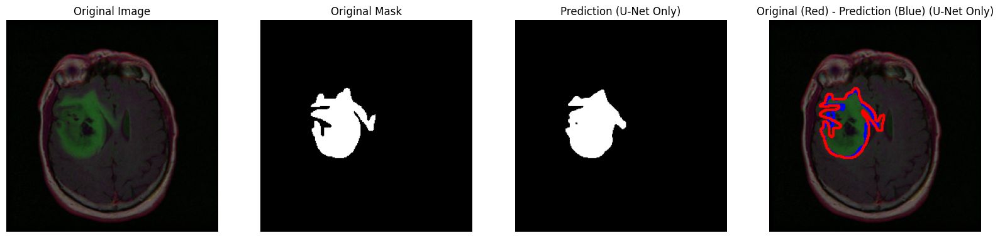

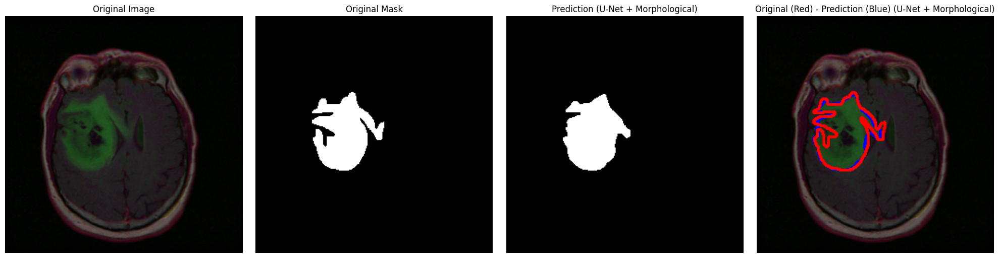

1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 27ms/step


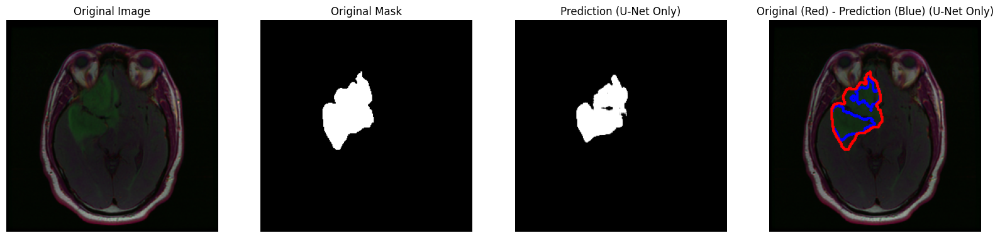

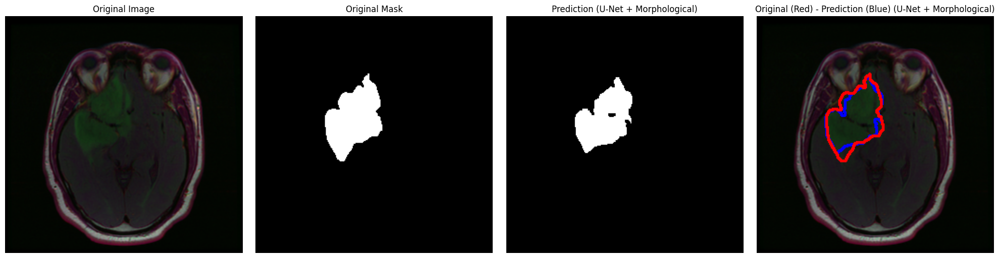

In [ ]:
# Displaying Images with U-Net Only and U-Net + Morphological Image Processing
rows_to_display = [1, 7, 11, 12, 21, 25]  # Specify the row indices you want to display

for row_index in rows_to_display:
    img_unet = cv2.imread(test_df['image_path'].iloc[row_index])
    img_unet = cv2.resize(img_unet, (256, 256))
    img_unet = img_unet / 255
    img_unet = img_unet[np.newaxis, :, :, :]

    mask_unet = cv2.imread(test_df['mask_path'].iloc[row_index], cv2.IMREAD_GRAYSCALE)
    mask_unet = cv2.resize(mask_unet, (256, 256))

    plt.figure(figsize=(20, 5))

    # Displaying Images with U-Net Only
    plt.subplot(1, 4, 1)
    plt.imshow(np.squeeze(img_unet))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 4, 2)
    plt.imshow(np.squeeze(mask_unet), cmap='gray')
    plt.axis('off')
    plt.title('Original Mask')

    predicted_img_unet = loaded_model.predict(img_unet)[0]

    plt.subplot(1, 4, 3)
    plt.imshow(predicted_img_unet, cmap='gray')
    plt.axis('off')
    plt.title('Prediction (U-Net Only)')

    img_contour_unet = np.squeeze(img_unet)
    mask_contour_unet = np.uint8(np.squeeze(mask_unet))
    predicted_contour_unet = np.uint8(np.squeeze(predicted_img_unet))
    contours_unet, _ = cv2.findContours(predicted_contour_unet, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contour_unet = cv2.drawContours(img_contour_unet, contours_unet, -1, (0, 0, 255), 2)
    contours_unet, _ = cv2.findContours(mask_contour_unet, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contour_unet = cv2.drawContours(img_contour_unet, contours_unet, -1, (255, 0, 0), 2)

    plt.subplot(1, 4, 4)
    plt.imshow(img_contour_unet, cmap='gray')
    plt.axis('off')
    plt.title('Original (Red) - Prediction (Blue) (U-Net Only)')

    # Displaying Images with U-Net + Morphological Image Processing
    plt.figure(figsize=(20, 5))

    img_morph = cv2.imread(test_df['image_path'].iloc[row_index])
    img_morph = cv2.resize(img_morph, (256, 256))
    img_morph = img_morph / 255
    img_morph = img_morph[np.newaxis, :, :, :]

    mask_morph = cv2.imread(test_df['mask_path'].iloc[row_index], cv2.IMREAD_GRAYSCALE)
    mask_morph = cv2.resize(mask_morph, (256, 256))

    plt.subplot(1, 4, 1)
    plt.imshow(np.squeeze(img_morph))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 4, 2)
    plt.imshow(np.squeeze(mask_morph), cmap='gray')
    plt.axis('off')
    plt.title('Original Mask')

    predicted_img_morph = loaded_model.predict(img_morph)[0]
    refined_mask_morph = apply_morphological_operations(predicted_img_morph)
    refined_mask_bin_morph = cv2.threshold(refined_mask_morph, 0.5, 1, cv2.THRESH_BINARY)[1]

    plt.subplot(1, 4, 3)
    plt.imshow(refined_mask_bin_morph, cmap='gray')
    plt.axis('off')
    plt.title('Prediction (U-Net + Morphological)')

    img_contour_morph = np.squeeze(img_morph)
    mask_contour_morph = np.uint8(np.squeeze(mask_morph))
    refined_contour_morph = np.uint8(np.squeeze(refined_mask_bin_morph))
    contours_morph, _ = cv2.findContours(refined_contour_morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contour_morph = cv2.drawContours(img_contour_morph, contours_morph, -1, (0, 0, 255), 2)
    contours_morph, _ = cv2.findContours(mask_contour_morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contour_morph = cv2.drawContours(img_contour_morph, contours_morph, -1, (255, 0, 0), 2)

    plt.subplot(1, 4, 4)
    plt.imshow(img_contour_morph, cmap='gray')
    plt.axis('off')
    plt.title('Original (Red) - Prediction (Blue) (U-Net + Morphological)')

    plt.tight_layout()
    plt.show()

---


**RESULTS**

The U-Net model alone demonstrates its capability to generate accurate predictions for object segmentation. The U-Net predictions capture the general shape and location of the objects of interest, aligning reasonably well with the boundaries outlined in the ground truth masks. This highlights the effectiveness of U-Net in learning intricate patterns and features from the training data. In some cases, the U-Net predictions may exhibit gaps or holes within the segmented objects, failing to completely fill them in. To address these shortcomings, the hybrid approach incorporates morphological image processing techniques after obtaining the U-Net predictions. By applying dilation and erosion operations, the hybrid approach aims to refine and improve the predicted masks. The morphological operations help fill in the gaps, connect fragmented regions, and smoothen the boundaries of the objects.

In summary, while the hybrid approach of combining U-Net with morphological image processing may not result in significant improvements in every case, it does offer benefits such as filling gaps
and smoothening boundaries. The choice of whether to incorporate such post-processing techniques depends on the specific requirements of the task at hand and the characteristics of the dataset.
Experimenting with different combinations of models and image processing methods can lead tofurther advancements in object segmentation and provide valuable insights for future research in this field.